C:\Users\ilaki\AppData\Local\Temp\ipykernel_11924\3713023157.py:79: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location=devic

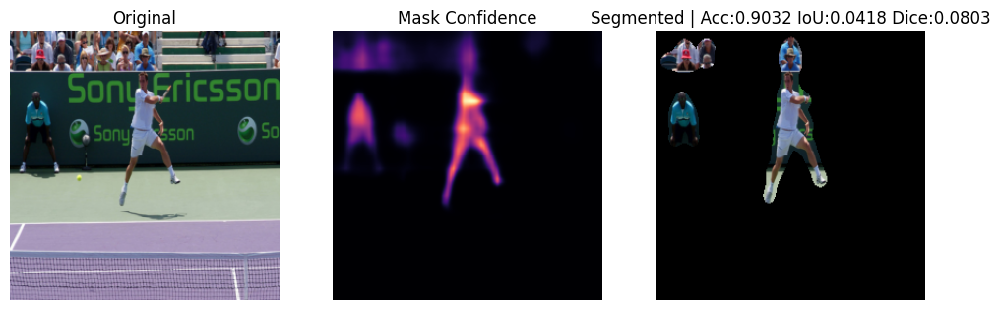

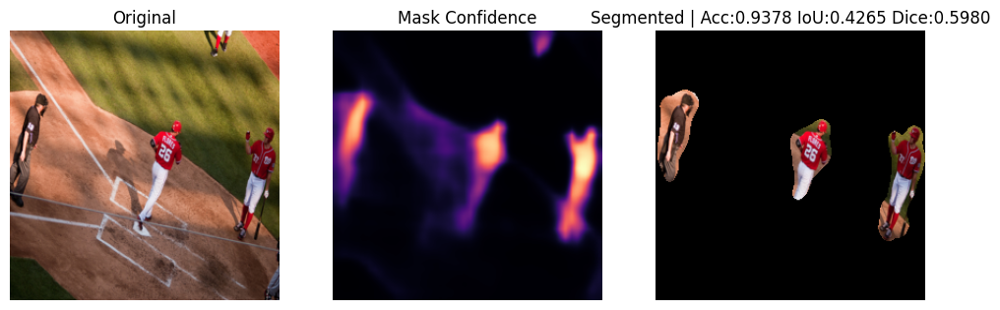

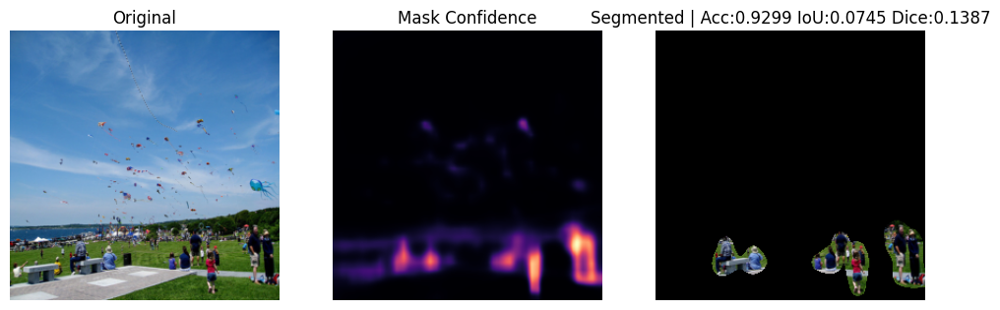

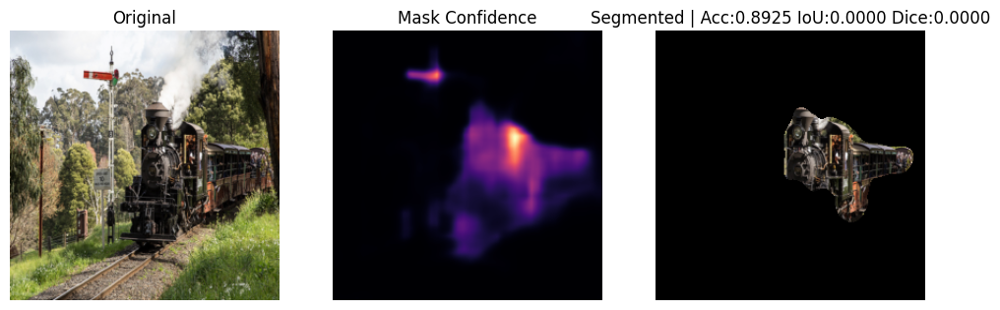

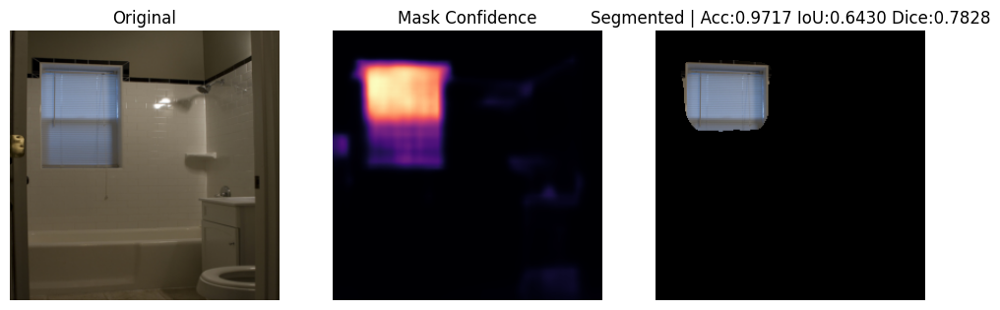

...

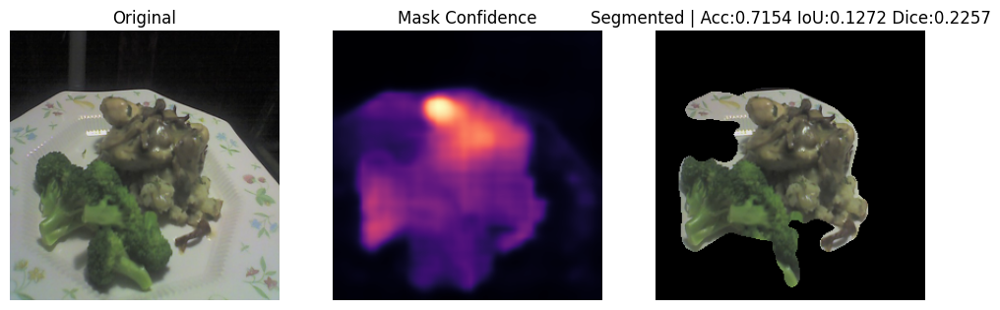

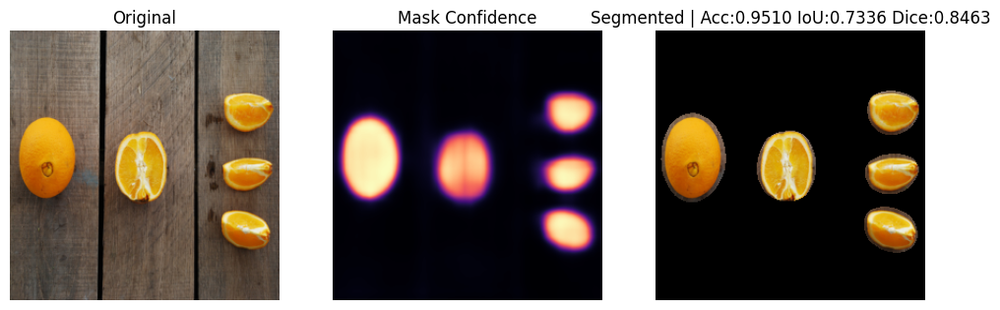

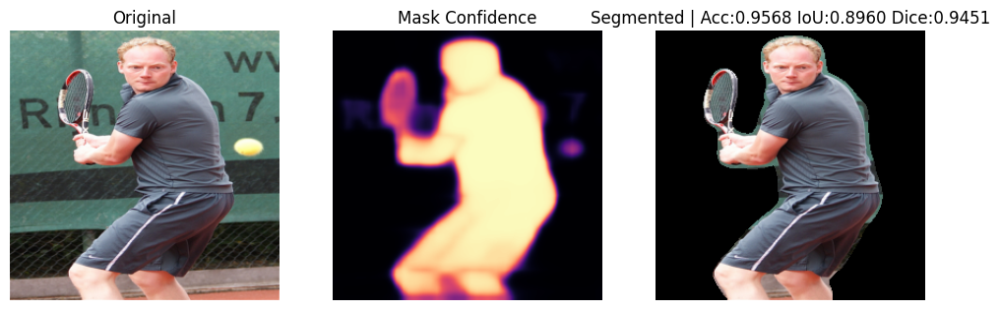

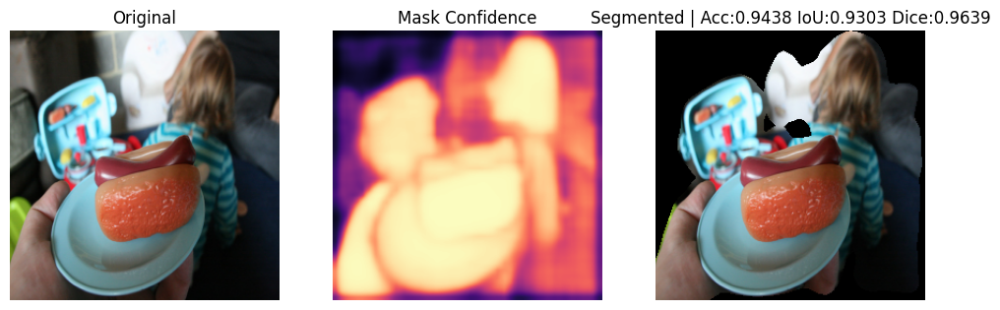

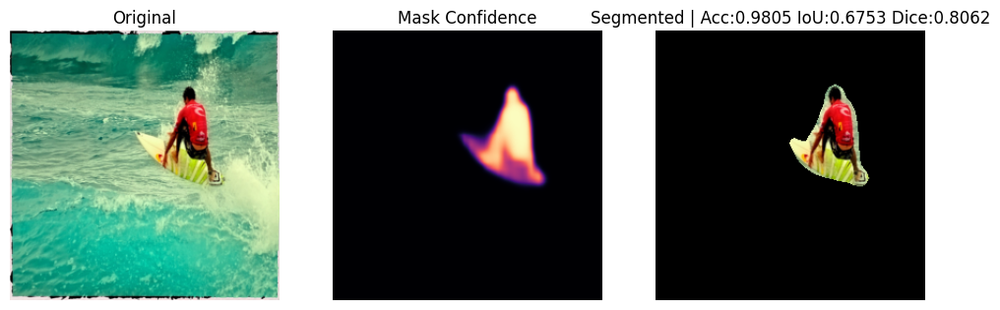

Average Pixel Accuracy: 0.9132159423828125
Average IoU: 0.5196413458210136
Average Dice: 0.6006983544313844


In [53]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.morphology import remove_small_objects, remove_small_holes, closing, disk
from skimage.filters import threshold_otsu
from scipy.ndimage import gaussian_filter, binary_dilation
from torchvision import transforms
import torchvision
import random

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ---- Paths ----
images_path = r"C:\Users\ilaki\Desktop\VISON_AI\coco2017\val2017"
checkpoint_path = r"C:\Users\ilaki\Desktop\VISON_AI\coco2017\deeplabv3_resumed_epoch30.pth"
save_path = r"C:\Users\ilaki\Desktop\VISON_AI\segmented_output"
os.makedirs(save_path, exist_ok=True)

num_classes = 2
image_size = 256

# ---- Mask refinement ----
def refine_mask(prob_mask, min_size=500, dilate_size=3):
    """Adaptive smoothing + threshold + morphology"""
    # Smooth
    smoothed = gaussian_filter(prob_mask, sigma=1.0)
    smoothed = gaussian_filter(smoothed, sigma=2.0)
    
    # Adaptive threshold
    try:
        thresh_val = threshold_otsu(smoothed)
    except:
        thresh_val = 0.3 * smoothed.max()
    mask = (smoothed > thresh_val).astype(np.uint8)
    
    # Morphology
    mask = remove_small_objects(mask.astype(bool), min_size=min_size)
    mask = remove_small_holes(mask, area_threshold=min_size)
    mask = closing(mask, disk(3))
    mask = binary_dilation(mask, structure=disk(dilate_size))
    
    return mask.astype(np.uint8)

# ---- TTA inference ----
def tta_inference(model, img_tensor, scales=[0.5,0.75,1.0,1.25,1.5], flips=[None,'h','v'], rotations=[0,90,180,270]):
    model.eval()
    _, C, H, W = img_tensor.shape
    agg_output = torch.zeros((1, num_classes, H, W), device=img_tensor.device)

    for scale in scales:
        scaled_img = img_tensor if scale==1.0 else torch.nn.functional.interpolate(
            img_tensor, size=(int(H*scale), int(W*scale)), mode='bilinear', align_corners=False)
        for f in flips:
            inp = scaled_img
            if f=='h': inp = torch.flip(scaled_img, dims=[3])
            if f=='v': inp = torch.flip(scaled_img, dims=[2])
            for rot in rotations:
                if rot !=0:
                    inp_rot = torch.rot90(inp, k=rot//90, dims=[2,3])
                else:
                    inp_rot = inp
                with torch.no_grad():
                    out = model(inp_rot)["out"]
                # un-rotate
                if rot !=0:
                    out = torch.rot90(out, k=(4-rot//90), dims=[2,3])
                if f=='h': out = torch.flip(out, dims=[3])
                if f=='v': out = torch.flip(out, dims=[2])
                if scale!=1.0:
                    out = torch.nn.functional.interpolate(out, size=(H,W), mode='bilinear', align_corners=False)
                agg_output += out
    agg_output /= (len(scales) * len(flips) * len(rotations))
    return agg_output

# ---- Load model ----
model = torchvision.models.segmentation.deeplabv3_resnet50(pretrained=False, aux_loss=True, num_classes=num_classes)
checkpoint = torch.load(checkpoint_path, map_location=device)
state_dict = {k: v for k, v in checkpoint.items() if "aux_classifier" not in k}
model.load_state_dict(state_dict, strict=False)
model.to(device)
model.eval()

# ---- Image transforms ----
transform = transforms.Compose([
    transforms.Resize((image_size,image_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.485,0.456,0.406), std=(0.229,0.224,0.225))
])

def denormalize(img_tensor):
    img = img_tensor.permute(1,2,0).cpu().numpy()
    img = img * np.array([0.229,0.224,0.225]) + np.array([0.485,0.456,0.406])
    return np.clip(img,0,1)

# ---- Metrics ----
def pixel_accuracy(preds, masks):
    preds = torch.argmax(preds, dim=1)
    masks = masks.squeeze(0)
    return (preds == masks).float().mean().item()

def iou_score(preds, masks, num_classes=2):
    preds = torch.argmax(preds, dim=1)
    masks = masks.squeeze(0)
    ious=[]
    for cls in range(1,num_classes):
        intersection = ((preds==cls)&(masks==cls)).sum().item()
        union = ((preds==cls)|(masks==cls)).sum().item()
        if union==0: continue
        ious.append(intersection/(union+1e-6))
    return np.mean(ious) if len(ious)>0 else 1.0

def dice_score(preds, masks, num_classes=2):
    preds = torch.argmax(preds, dim=1)
    masks = masks.squeeze(0)
    dices=[]
    for cls in range(1,num_classes):
        intersection = ((preds==cls)&(masks==cls)).sum().item()
        total = (preds==cls).sum().item() + (masks==cls).sum().item()
        if total==0: continue
        dices.append(2*intersection/(total+1e-6))
    return np.mean(dices) if len(dices)>0 else 1.0

# ---- Run inference on random 25 images ----
image_files = [f for f in os.listdir(images_path) if f.lower().endswith(('.jpg','.png','.jpeg'))]
selected_files = random.sample(image_files, min(25,len(image_files)))

all_pixel_acc, all_iou, all_dice = [], [], []

for img_name in selected_files:
    img_path = os.path.join(images_path,img_name)
    img_pil = Image.open(img_path).convert("RGB")
    img_tensor = transform(img_pil).unsqueeze(0).to(device)

    output = tta_inference(model, img_tensor)
    prob_mask = torch.softmax(output, dim=1)[0,1].cpu().numpy()
    final_mask = refine_mask(prob_mask)

    img_np = denormalize(img_tensor[0])

    # Extract segmented piece
    segmented = img_np.copy()
    segmented[final_mask==0]=0

    # Metrics
    mask_tensor = torch.tensor(final_mask, dtype=torch.long).unsqueeze(0).to(device)
    pixel_acc = pixel_accuracy(output, mask_tensor)
    iou = iou_score(output, mask_tensor)
    dice = dice_score(output, mask_tensor)
    all_pixel_acc.append(pixel_acc)
    all_iou.append(iou)
    all_dice.append(dice)

    # Save segmented image
    segmented_img = (segmented*255).astype(np.uint8)
    Image.fromarray(segmented_img).save(os.path.join(save_path,f"seg_{img_name}"))

    # Show
    plt.figure(figsize=(12,4))
    plt.subplot(1,3,1)
    plt.title("Original")
    plt.imshow(img_np)
    plt.axis("off")
    plt.subplot(1,3,2)
    plt.title("Mask Confidence")
    plt.imshow(prob_mask, cmap='magma')
    plt.axis("off")
    plt.subplot(1,3,3)
    plt.title(f"Segmented | Acc:{pixel_acc:.4f} IoU:{iou:.4f} Dice:{dice:.4f}")
    plt.imshow(segmented)
    plt.axis("off")
    plt.show()

# ---- Average metrics ----
print("Average Pixel Accuracy:", np.mean(all_pixel_acc))
print("Average IoU:", np.mean(all_iou))
print("Average Dice:", np.mean(all_dice))


C:\Users\ilaki\AppData\Local\Temp\ipykernel_11924\3713023157.py:79: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location=devic

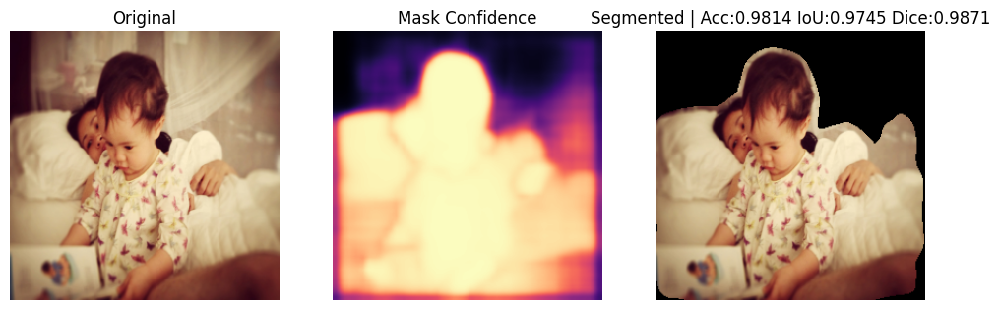

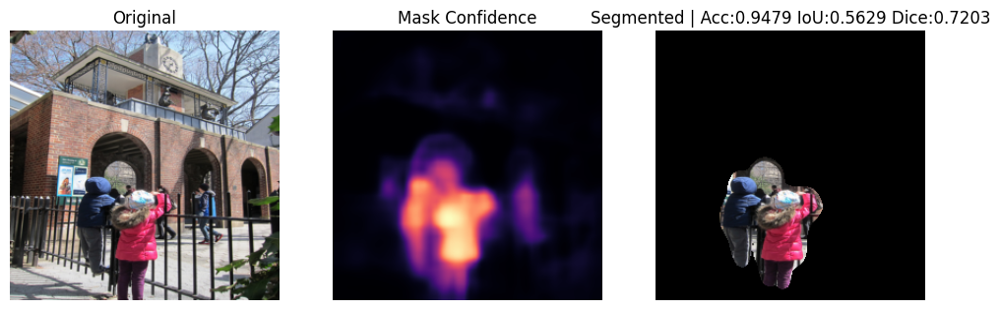

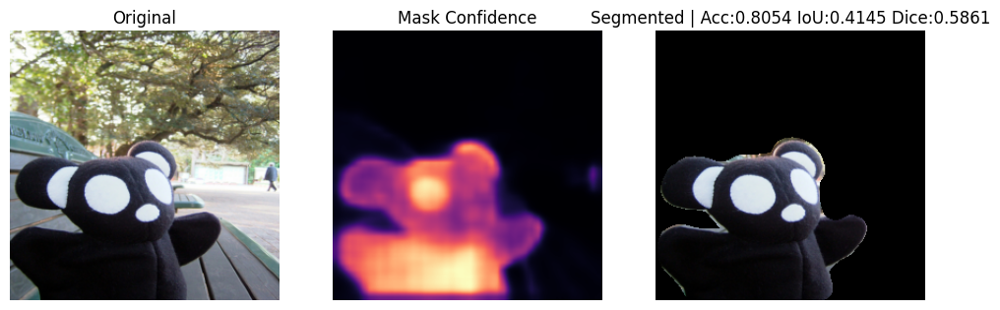

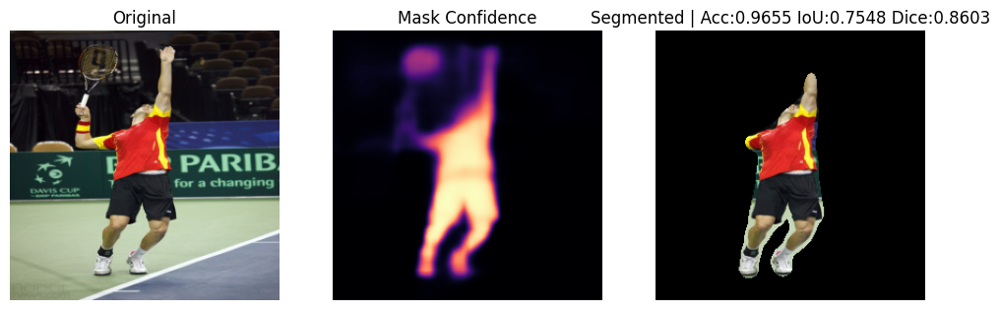

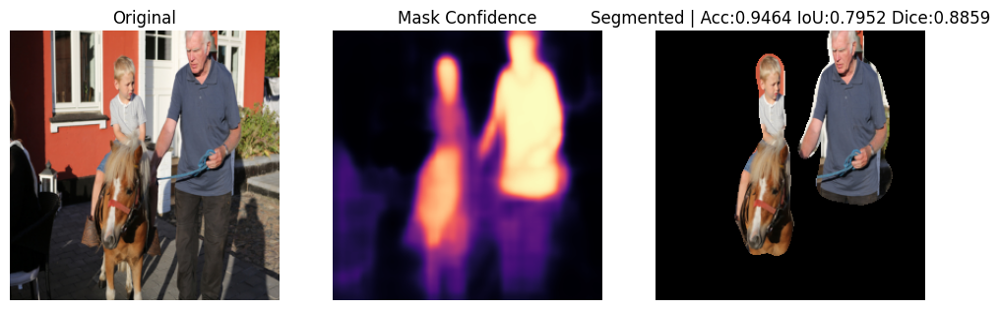

...

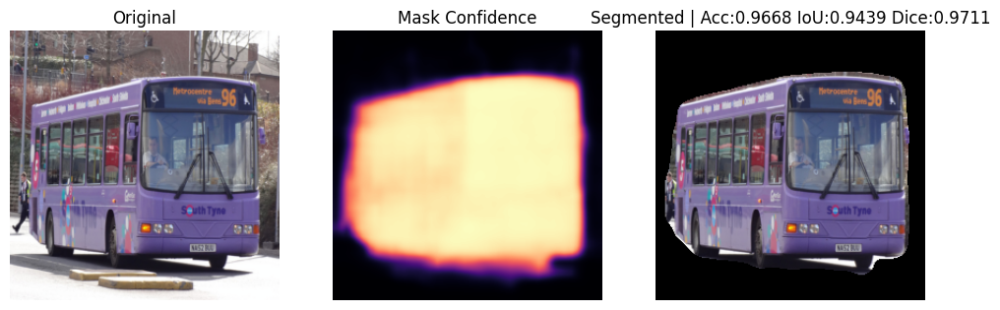

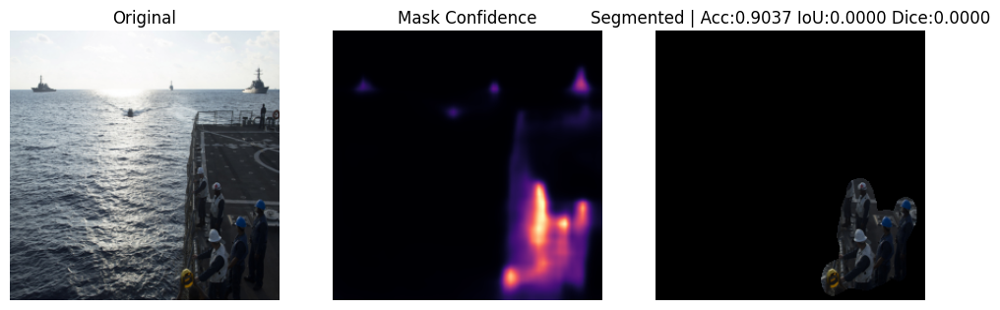

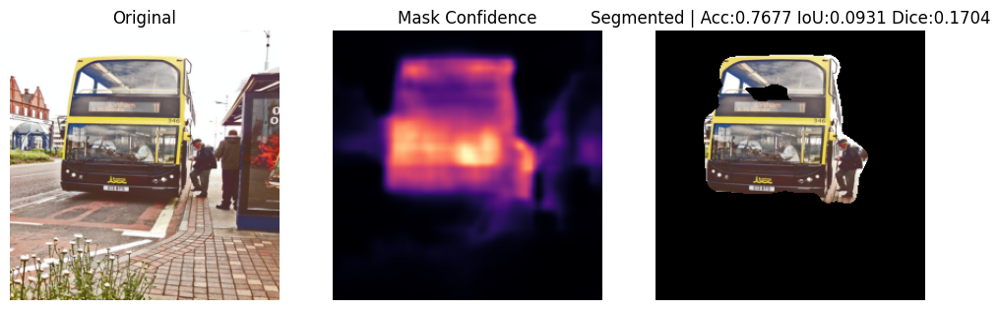

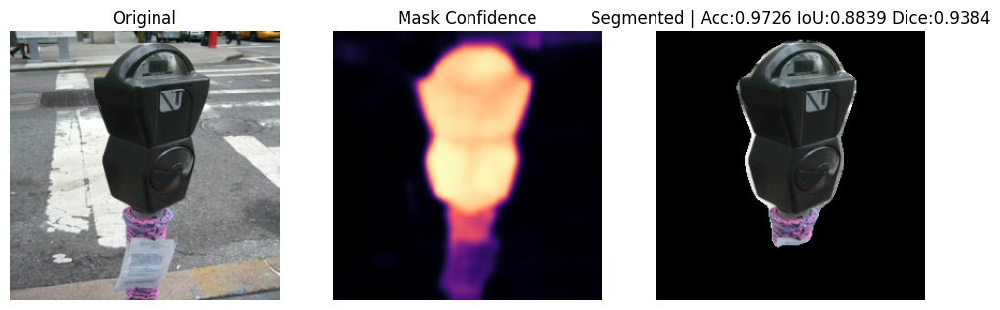

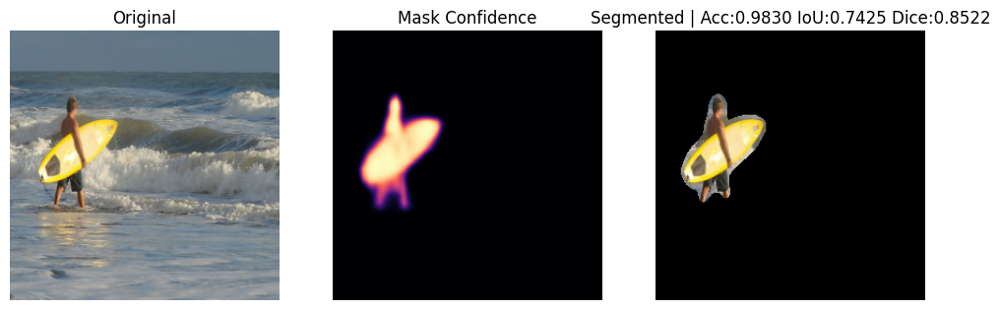

Average Pixel Accuracy: 0.9229400634765625
Average IoU: 0.6153902337076779
Average Dice: 0.6938701220115289


In [56]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.morphology import remove_small_objects, remove_small_holes, closing, disk
from skimage.filters import threshold_otsu
from scipy.ndimage import gaussian_filter, binary_dilation
from torchvision import transforms
import torchvision
import random

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ---- Paths ----
images_path = r"C:\Users\ilaki\Desktop\VISON_AI\coco2017\val2017"
checkpoint_path = r"C:\Users\ilaki\Desktop\VISON_AI\coco2017\deeplabv3_resumed_epoch30.pth"
save_path = r"C:\Users\ilaki\Desktop\VISON_AI\segmented_output"
os.makedirs(save_path, exist_ok=True)

num_classes = 2
image_size = 256

# ---- Mask refinement ----
def refine_mask(prob_mask, min_size=500, dilate_size=3):
    """Adaptive smoothing + threshold + morphology"""
    # Smooth
    smoothed = gaussian_filter(prob_mask, sigma=1.0)
    smoothed = gaussian_filter(smoothed, sigma=2.0)
    
    # Adaptive threshold
    try:
        thresh_val = threshold_otsu(smoothed)
    except:
        thresh_val = 0.3 * smoothed.max()
    mask = (smoothed > thresh_val).astype(np.uint8)
    
    # Morphology
    mask = remove_small_objects(mask.astype(bool), min_size=min_size)
    mask = remove_small_holes(mask, area_threshold=min_size)
    mask = closing(mask, disk(3))
    mask = binary_dilation(mask, structure=disk(dilate_size))
    
    return mask.astype(np.uint8)

# ---- TTA inference ----
def tta_inference(model, img_tensor, scales=[0.5,0.75,1.0,1.25,1.5], flips=[None,'h','v'], rotations=[0,90,180,270]):
    model.eval()
    _, C, H, W = img_tensor.shape
    agg_output = torch.zeros((1, num_classes, H, W), device=img_tensor.device)

    for scale in scales:
        scaled_img = img_tensor if scale==1.0 else torch.nn.functional.interpolate(
            img_tensor, size=(int(H*scale), int(W*scale)), mode='bilinear', align_corners=False)
        for f in flips:
            inp = scaled_img
            if f=='h': inp = torch.flip(scaled_img, dims=[3])
            if f=='v': inp = torch.flip(scaled_img, dims=[2])
            for rot in rotations:
                if rot !=0:
                    inp_rot = torch.rot90(inp, k=rot//90, dims=[2,3])
                else:
                    inp_rot = inp
                with torch.no_grad():
                    out = model(inp_rot)["out"]
                # un-rotate
                if rot !=0:
                    out = torch.rot90(out, k=(4-rot//90), dims=[2,3])
                if f=='h': out = torch.flip(out, dims=[3])
                if f=='v': out = torch.flip(out, dims=[2])
                if scale!=1.0:
                    out = torch.nn.functional.interpolate(out, size=(H,W), mode='bilinear', align_corners=False)
                agg_output += out
    agg_output /= (len(scales) * len(flips) * len(rotations))
    return agg_output

# ---- Load model ----
model = torchvision.models.segmentation.deeplabv3_resnet50(pretrained=False, aux_loss=True, num_classes=num_classes)
checkpoint = torch.load(checkpoint_path, map_location=device)
state_dict = {k: v for k, v in checkpoint.items() if "aux_classifier" not in k}
model.load_state_dict(state_dict, strict=False)
model.to(device)
model.eval()

# ---- Image transforms ----
transform = transforms.Compose([
    transforms.Resize((image_size,image_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.485,0.456,0.406), std=(0.229,0.224,0.225))
])

def denormalize(img_tensor):
    img = img_tensor.permute(1,2,0).cpu().numpy()
    img = img * np.array([0.229,0.224,0.225]) + np.array([0.485,0.456,0.406])
    return np.clip(img,0,1)

# ---- Metrics ----
def pixel_accuracy(preds, masks):
    preds = torch.argmax(preds, dim=1)
    masks = masks.squeeze(0)
    return (preds == masks).float().mean().item()

def iou_score(preds, masks, num_classes=2):
    preds = torch.argmax(preds, dim=1)
    masks = masks.squeeze(0)
    ious=[]
    for cls in range(1,num_classes):
        intersection = ((preds==cls)&(masks==cls)).sum().item()
        union = ((preds==cls)|(masks==cls)).sum().item()
        if union==0: continue
        ious.append(intersection/(union+1e-6))
    return np.mean(ious) if len(ious)>0 else 1.0

def dice_score(preds, masks, num_classes=2):
    preds = torch.argmax(preds, dim=1)
    masks = masks.squeeze(0)
    dices=[]
    for cls in range(1,num_classes):
        intersection = ((preds==cls)&(masks==cls)).sum().item()
        total = (preds==cls).sum().item() + (masks==cls).sum().item()
        if total==0: continue
        dices.append(2*intersection/(total+1e-6))
    return np.mean(dices) if len(dices)>0 else 1.0

# ---- Run inference on random 25 images ----
image_files = [f for f in os.listdir(images_path) if f.lower().endswith(('.jpg','.png','.jpeg'))]
selected_files = random.sample(image_files, min(25,len(image_files)))

all_pixel_acc, all_iou, all_dice = [], [], []

for img_name in selected_files:
    img_path = os.path.join(images_path,img_name)
    img_pil = Image.open(img_path).convert("RGB")
    img_tensor = transform(img_pil).unsqueeze(0).to(device)

    output = tta_inference(model, img_tensor)
    prob_mask = torch.softmax(output, dim=1)[0,1].cpu().numpy()
    final_mask = refine_mask(prob_mask)

    img_np = denormalize(img_tensor[0])

    # Extract segmented piece
    segmented = img_np.copy()
    segmented[final_mask==0]=0

    # Metrics
    mask_tensor = torch.tensor(final_mask, dtype=torch.long).unsqueeze(0).to(device)
    pixel_acc = pixel_accuracy(output, mask_tensor)
    iou = iou_score(output, mask_tensor)
    dice = dice_score(output, mask_tensor)
    all_pixel_acc.append(pixel_acc)
    all_iou.append(iou)
    all_dice.append(dice)

    # Save segmented image
    segmented_img = (segmented*255).astype(np.uint8)
    Image.fromarray(segmented_img).save(os.path.join(save_path,f"seg_{img_name}"))

    # Show
    plt.figure(figsize=(12,4))
    plt.subplot(1,3,1)
    plt.title("Original")
    plt.imshow(img_np)
    plt.axis("off")
    plt.subplot(1,3,2)
    plt.title("Mask Confidence")
    plt.imshow(prob_mask, cmap='magma')
    plt.axis("off")
    plt.subplot(1,3,3)
    plt.title(f"Segmented | Acc:{pixel_acc:.4f} IoU:{iou:.4f} Dice:{dice:.4f}")
    plt.imshow(segmented)
    plt.axis("off")
    plt.show()

# ---- Average metrics ----
print("Average Pixel Accuracy:", np.mean(all_pixel_acc))
print("Average IoU:", np.mean(all_iou))
print("Average Dice:", np.mean(all_dice))


C:\Users\ilaki\AppData\Local\Temp\ipykernel_11924\3713023157.py:79: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location=devic

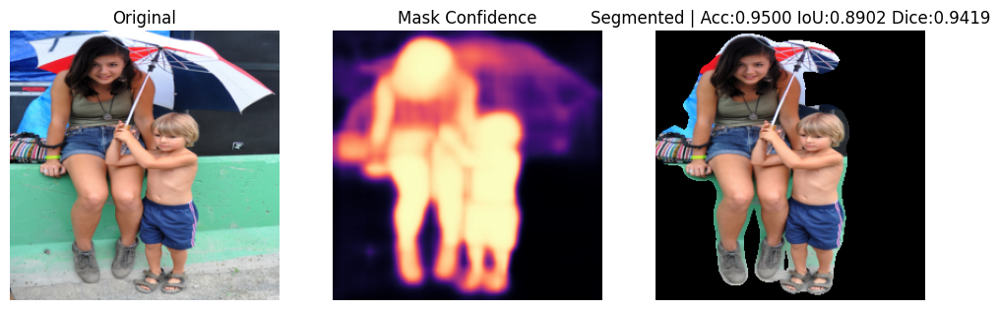

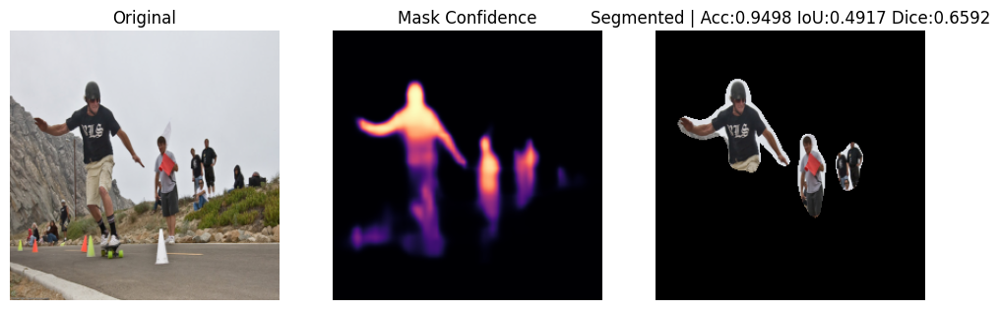

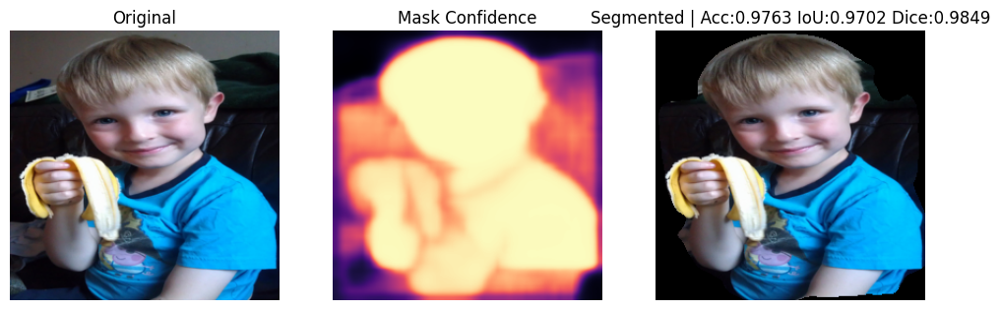

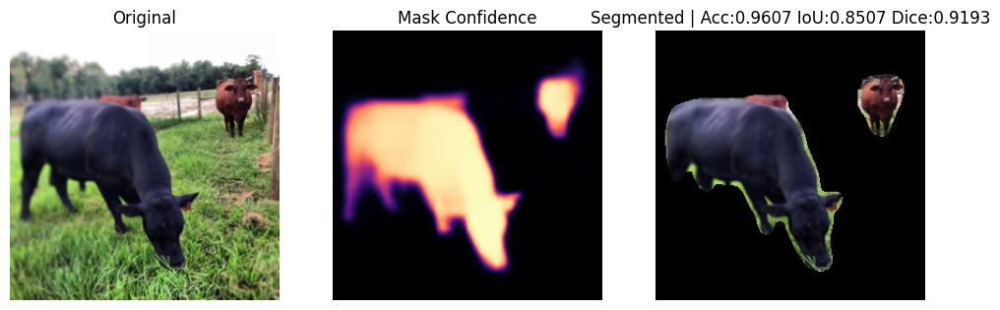

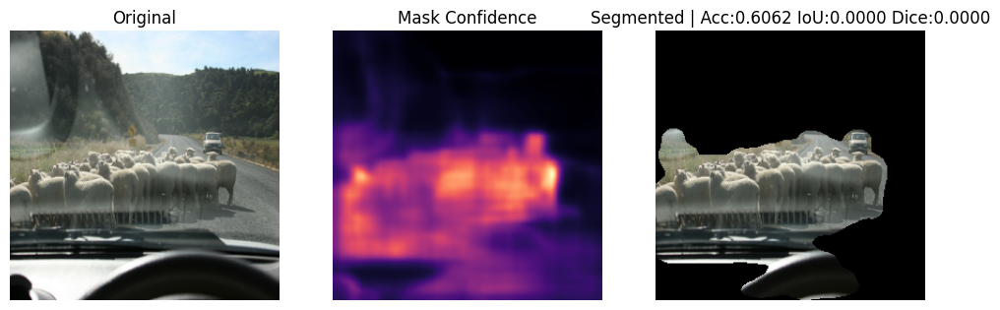

...

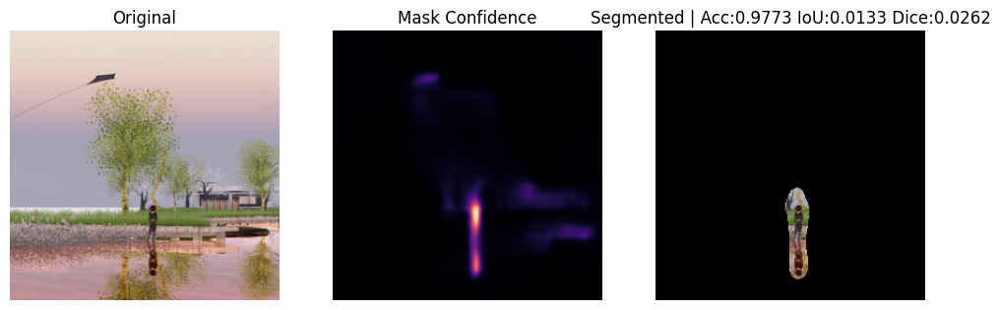

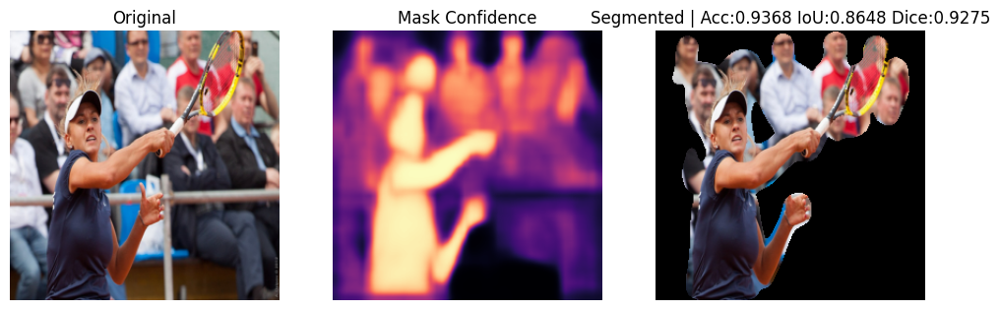

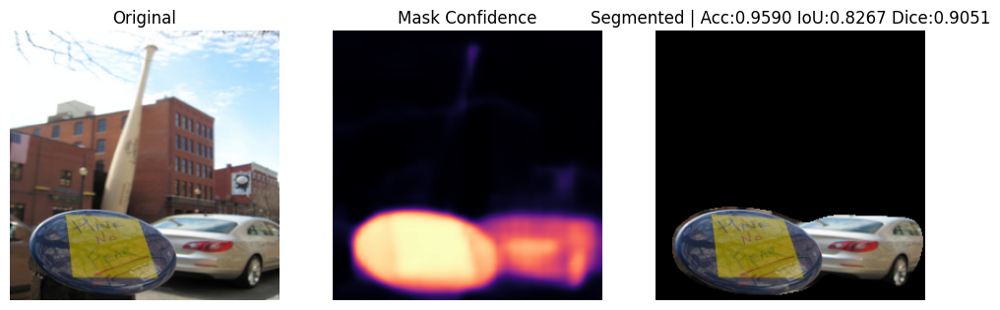

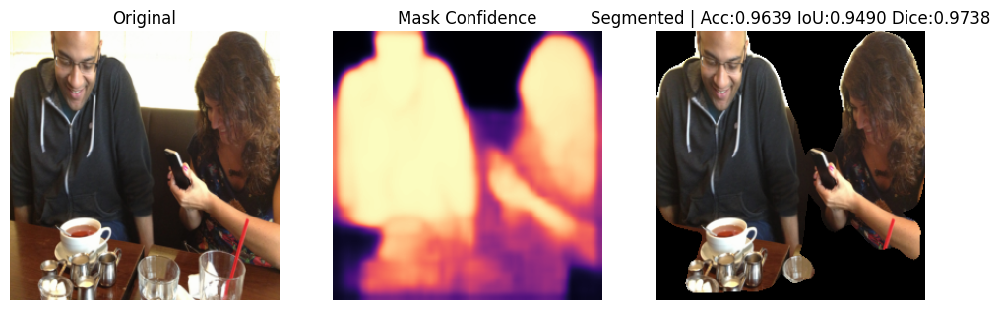

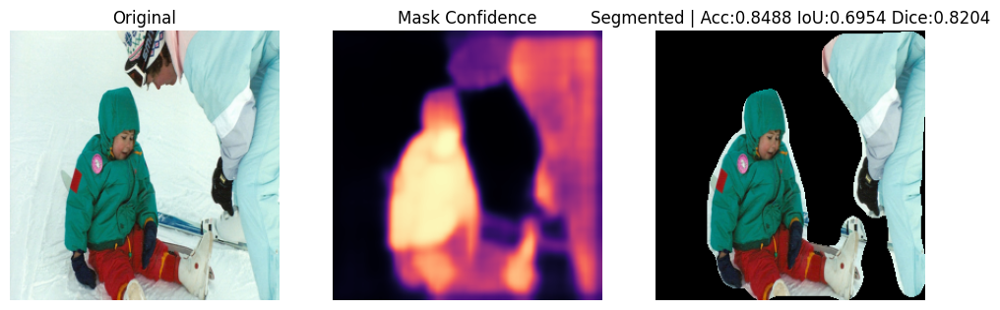

Average Pixel Accuracy: 0.9011553955078125
Average IoU: 0.6339095497802905
Average Dice: 0.7155633028887054


In [58]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.morphology import remove_small_objects, remove_small_holes, closing, disk
from skimage.filters import threshold_otsu
from scipy.ndimage import gaussian_filter, binary_dilation
from torchvision import transforms
import torchvision
import random

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ---- Paths ----
images_path = r"C:\Users\ilaki\Desktop\VISON_AI\coco2017\val2017"
checkpoint_path = r"C:\Users\ilaki\Desktop\VISON_AI\coco2017\deeplabv3_resumed_epoch30.pth"
save_path = r"C:\Users\ilaki\Desktop\VISON_AI\segmented_output"
os.makedirs(save_path, exist_ok=True)

num_classes = 2
image_size = 256

# ---- Mask refinement ----
def refine_mask(prob_mask, min_size=500, dilate_size=3):
    """Adaptive smoothing + threshold + morphology"""
    # Smooth
    smoothed = gaussian_filter(prob_mask, sigma=1.0)
    smoothed = gaussian_filter(smoothed, sigma=2.0)
    
    # Adaptive threshold
    try:
        thresh_val = threshold_otsu(smoothed)
    except:
        thresh_val = 0.3 * smoothed.max()
    mask = (smoothed > thresh_val).astype(np.uint8)
    
    # Morphology
    mask = remove_small_objects(mask.astype(bool), min_size=min_size)
    mask = remove_small_holes(mask, area_threshold=min_size)
    mask = closing(mask, disk(3))
    mask = binary_dilation(mask, structure=disk(dilate_size))
    
    return mask.astype(np.uint8)

# ---- TTA inference ----
def tta_inference(model, img_tensor, scales=[0.5,0.75,1.0,1.25,1.5], flips=[None,'h','v'], rotations=[0,90,180,270]):
    model.eval()
    _, C, H, W = img_tensor.shape
    agg_output = torch.zeros((1, num_classes, H, W), device=img_tensor.device)

    for scale in scales:
        scaled_img = img_tensor if scale==1.0 else torch.nn.functional.interpolate(
            img_tensor, size=(int(H*scale), int(W*scale)), mode='bilinear', align_corners=False)
        for f in flips:
            inp = scaled_img
            if f=='h': inp = torch.flip(scaled_img, dims=[3])
            if f=='v': inp = torch.flip(scaled_img, dims=[2])
            for rot in rotations:
                if rot !=0:
                    inp_rot = torch.rot90(inp, k=rot//90, dims=[2,3])
                else:
                    inp_rot = inp
                with torch.no_grad():
                    out = model(inp_rot)["out"]
                # un-rotate
                if rot !=0:
                    out = torch.rot90(out, k=(4-rot//90), dims=[2,3])
                if f=='h': out = torch.flip(out, dims=[3])
                if f=='v': out = torch.flip(out, dims=[2])
                if scale!=1.0:
                    out = torch.nn.functional.interpolate(out, size=(H,W), mode='bilinear', align_corners=False)
                agg_output += out
    agg_output /= (len(scales) * len(flips) * len(rotations))
    return agg_output

# ---- Load model ----
model = torchvision.models.segmentation.deeplabv3_resnet50(pretrained=False, aux_loss=True, num_classes=num_classes)
checkpoint = torch.load(checkpoint_path, map_location=device)
state_dict = {k: v for k, v in checkpoint.items() if "aux_classifier" not in k}
model.load_state_dict(state_dict, strict=False)
model.to(device)
model.eval()

# ---- Image transforms ----
transform = transforms.Compose([
    transforms.Resize((image_size,image_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.485,0.456,0.406), std=(0.229,0.224,0.225))
])

def denormalize(img_tensor):
    img = img_tensor.permute(1,2,0).cpu().numpy()
    img = img * np.array([0.229,0.224,0.225]) + np.array([0.485,0.456,0.406])
    return np.clip(img,0,1)

# ---- Metrics ----
def pixel_accuracy(preds, masks):
    preds = torch.argmax(preds, dim=1)
    masks = masks.squeeze(0)
    return (preds == masks).float().mean().item()

def iou_score(preds, masks, num_classes=2):
    preds = torch.argmax(preds, dim=1)
    masks = masks.squeeze(0)
    ious=[]
    for cls in range(1,num_classes):
        intersection = ((preds==cls)&(masks==cls)).sum().item()
        union = ((preds==cls)|(masks==cls)).sum().item()
        if union==0: continue
        ious.append(intersection/(union+1e-6))
    return np.mean(ious) if len(ious)>0 else 1.0

def dice_score(preds, masks, num_classes=2):
    preds = torch.argmax(preds, dim=1)
    masks = masks.squeeze(0)
    dices=[]
    for cls in range(1,num_classes):
        intersection = ((preds==cls)&(masks==cls)).sum().item()
        total = (preds==cls).sum().item() + (masks==cls).sum().item()
        if total==0: continue
        dices.append(2*intersection/(total+1e-6))
    return np.mean(dices) if len(dices)>0 else 1.0

# ---- Run inference on random 25 images ----
image_files = [f for f in os.listdir(images_path) if f.lower().endswith(('.jpg','.png','.jpeg'))]
selected_files = random.sample(image_files, min(25,len(image_files)))

all_pixel_acc, all_iou, all_dice = [], [], []

for img_name in selected_files:
    img_path = os.path.join(images_path,img_name)
    img_pil = Image.open(img_path).convert("RGB")
    img_tensor = transform(img_pil).unsqueeze(0).to(device)

    output = tta_inference(model, img_tensor)
    prob_mask = torch.softmax(output, dim=1)[0,1].cpu().numpy()
    final_mask = refine_mask(prob_mask)

    img_np = denormalize(img_tensor[0])

    # Extract segmented piece
    segmented = img_np.copy()
    segmented[final_mask==0]=0

    # Metrics
    mask_tensor = torch.tensor(final_mask, dtype=torch.long).unsqueeze(0).to(device)
    pixel_acc = pixel_accuracy(output, mask_tensor)
    iou = iou_score(output, mask_tensor)
    dice = dice_score(output, mask_tensor)
    all_pixel_acc.append(pixel_acc)
    all_iou.append(iou)
    all_dice.append(dice)

    # Save segmented image
    segmented_img = (segmented*255).astype(np.uint8)
    Image.fromarray(segmented_img).save(os.path.join(save_path,f"seg_{img_name}"))

    # Show
    plt.figure(figsize=(12,4))
    plt.subplot(1,3,1)
    plt.title("Original")
    plt.imshow(img_np)
    plt.axis("off")
    plt.subplot(1,3,2)
    plt.title("Mask Confidence")
    plt.imshow(prob_mask, cmap='magma')
    plt.axis("off")
    plt.subplot(1,3,3)
    plt.title(f"Segmented | Acc:{pixel_acc:.4f} IoU:{iou:.4f} Dice:{dice:.4f}")
    plt.imshow(segmented)
    plt.axis("off")
    plt.show()

# ---- Average metrics ----
print("Average Pixel Accuracy:", np.mean(all_pixel_acc))
print("Average IoU:", np.mean(all_iou))
print("Average Dice:", np.mean(all_dice))
